In [3]:
import numpy as np
import io
import pandas as pd
import matplotlib.pyplot as plt
import cv2
from tensorflow.keras import Input
from glob import glob
import os # Consider Current Working Directory(CWD) as a folder, where the Python is operating. 
# Whenever the files are called only by their name, Python assumes that it starts in the CWD which 
# means that name-only reference will be successful only if the file is in the Python’s CWD.
%matplotlib inline

In [4]:
import tensorflow as tf

In [5]:
# tf.test.is_gpu_available()

In [6]:
# tf.config.list_physical_devices('GPU')

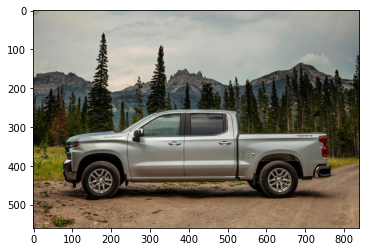

In [7]:
p=plt.imread("images/676069.png")
#c=cv2.resize(p,(120,120))
plt.imshow(p)

In [8]:
im=plt.imread("masks/676069.png")
(im*255).max()
im.shape
# plt.imshow(plt.imread("masks/676069.png"))

(560, 840)

In [9]:
%pwd

'C:\\Users\\DELL\\Downloads\\car-segmentation'

In [10]:
print(p.shape)
p.dtype

(560, 840, 3)


dtype('float32')

# Loading and preprocessing

length of given folder is  211
(256, 256, 3)


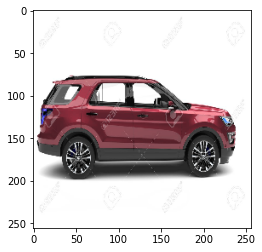

length of given folder is  211
(256, 256)


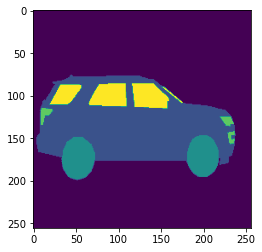

In [11]:
'''Read the images'''

def get_images(img_folder):
    #os library is used to scan the folder and store the filenames of the images
    filename= [f.path for f in os.scandir(img_folder) if f.is_file() and f.path.endswith(('.jpg','.png'))]
    print('length of given folder is ',len(filename))
    #this loop reads the images data and store into array
    img = []
    for i in range(len(filename)):
        img.append(cv2.imread(filename[i]))
     # resizing of images done using resize function from skimage library
    res_image=[]
    
    for i in range(len(img)):
        
        if img_folder=='masks':
            gray = cv2.cvtColor(img[i],cv2.COLOR_RGB2GRAY)
            res_image.append(cv2.resize(gray,(256,256)))
            
        else:
            rgb = cv2.cvtColor(img[i],cv2.COLOR_BGR2RGB)
            res_image.append(cv2.resize(img[i],(256,256)))
#         tem = cv2.resize(img[i],(256,256))
#         rs.append(np.reshape(tem,(256,256,1)))
# converting list of images to array as neural network models take arrays as input not lists
    Array_img = np.array(res_image) 
    print(Array_img[1].shape)
    plt.imshow(Array_img[1])
    plt.show()
    return Array_img
images = get_images('images')
masks = get_images('masks')

In [12]:
num_class = 5
#COLOR_DICT=[[0, 0, 0],[255, 0, 0],[120, 120, 120],[160, 160, 160],[200, 200, 200]]

class_name = ["background", "car", "wheel", "lights", "window"]

In [13]:
print(images.shape)
print(masks.shape)

(211, 256, 256, 3)
(211, 256, 256)


<ipython-input-14-4c17a362e8c7>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,15))


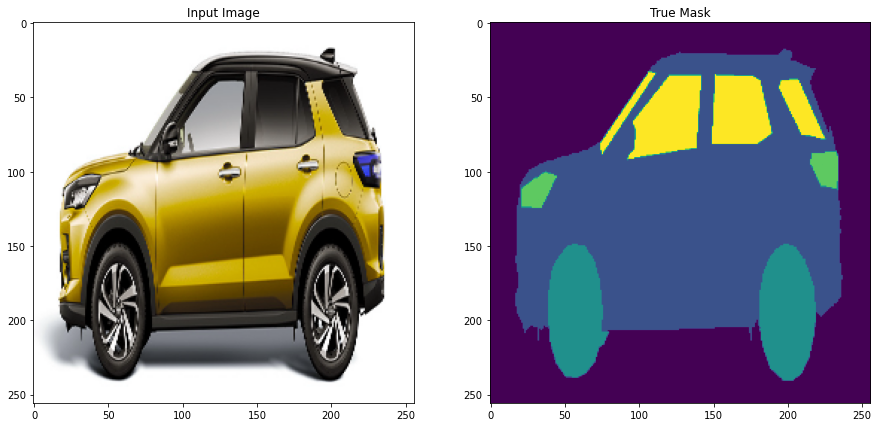

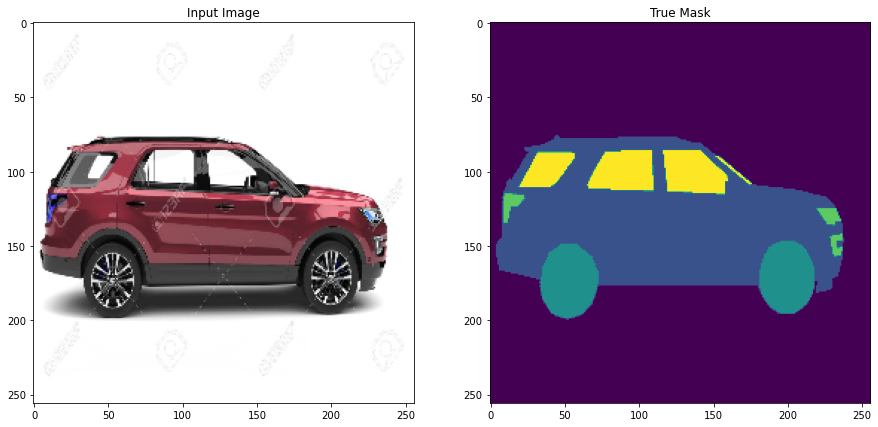

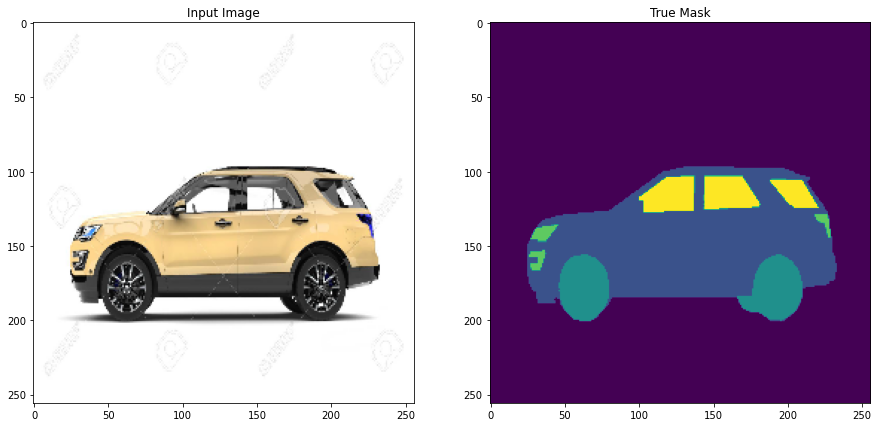

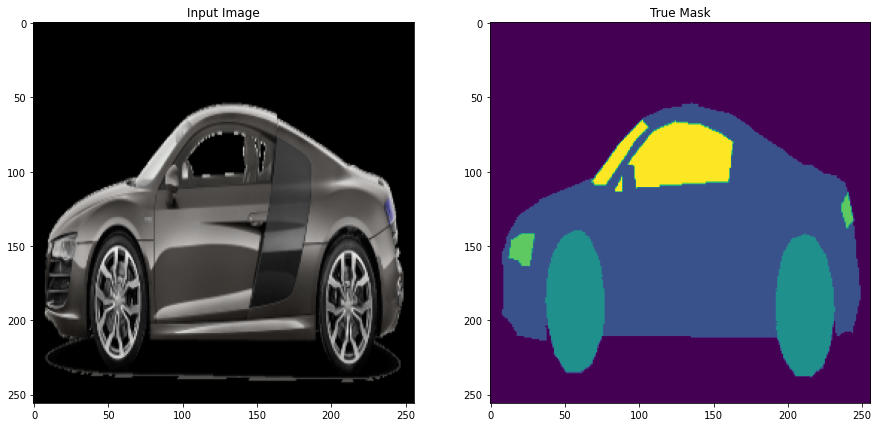

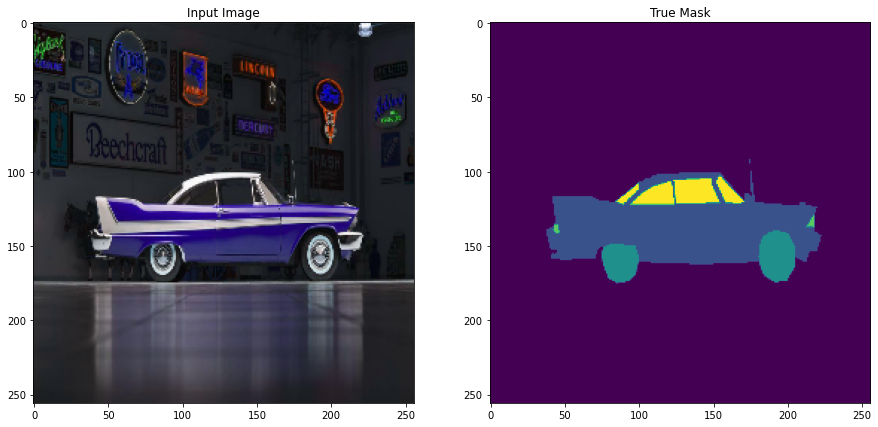

...

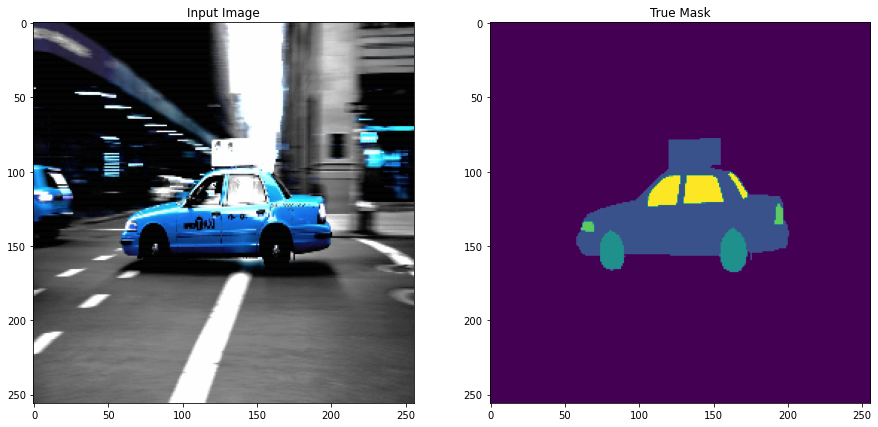

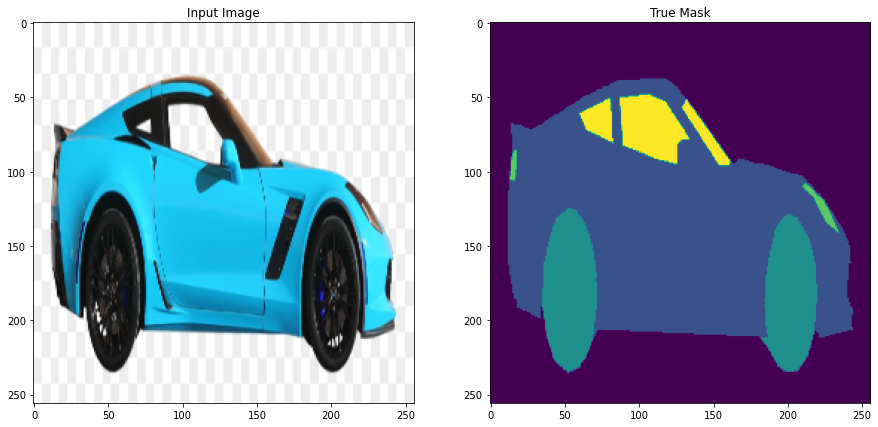

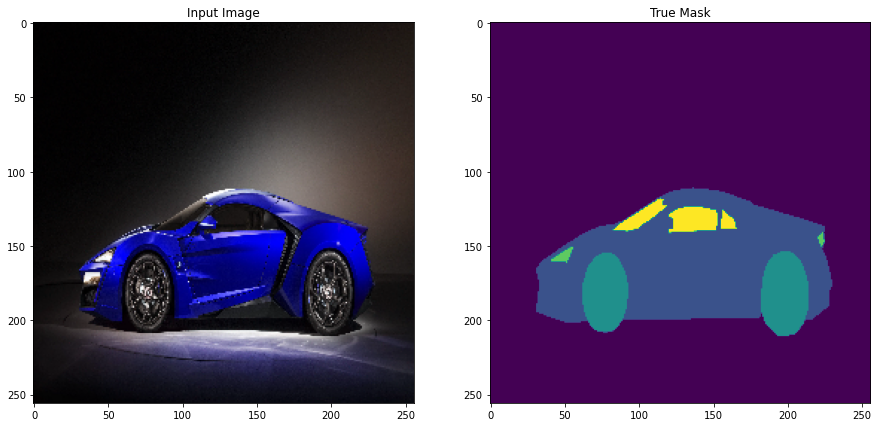

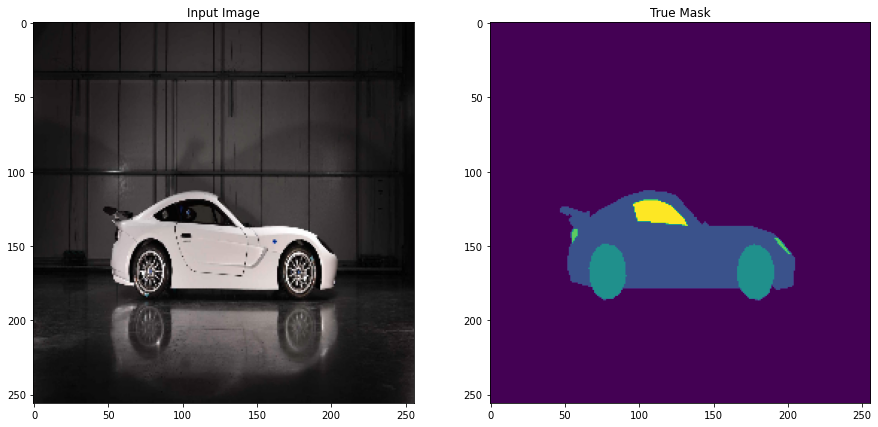

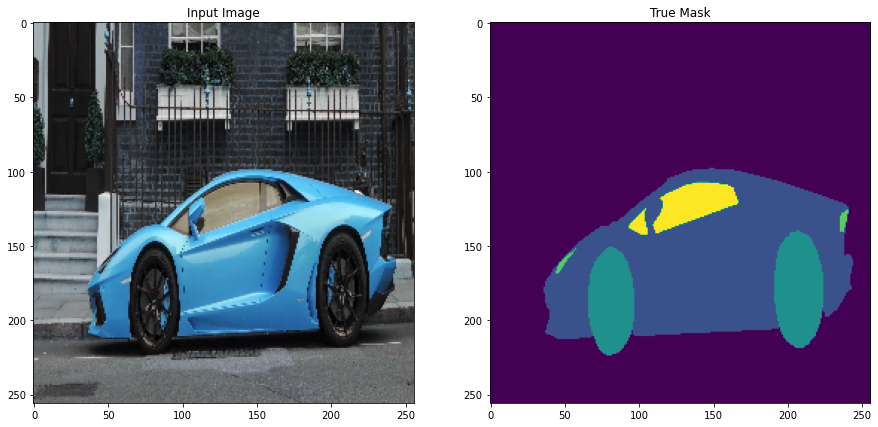

In [14]:
for i in range(50):
    kernel = np.ones((3,3), np.uint8)
    plt.figure(figsize=(15,15))
    plt.subplot(1,2,1)
    plt.imshow(images[i])
    plt.title('Input Image')
    plt.subplot(1,2,2)
    plt.imshow(masks[i])
    plt.title('True Mask')
    

In [15]:
print((images[0]).max())
print((masks[0]).max())

255
4


In [16]:
images=images/255

In [20]:
from keras.utils import to_categorical
train_masks_cat = to_categorical(masks, num_classes=5)
#y_train_cat = train_masks_cat.reshape((y_train.shape[0], y_train.shape[1], y_train.shape[2], n_classes))

In [21]:
train_masks_cat.shape

(211, 256, 256, 5)

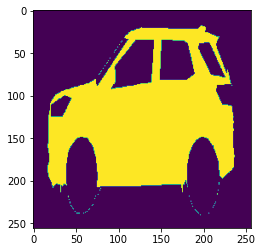

In [79]:
plt.imshow(train_masks_cat[0][...,1])

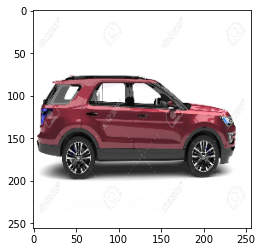

In [23]:
plt.imshow(images[1])

In [24]:
print('Actual image shape: ',images.shape)
print('mask image shape: ',masks.shape)

Actual image shape:  (211, 256, 256, 3)
mask image shape:  (211, 256, 256)


In [25]:
x=np.array(images)              # normal
y=np.array(train_masks_cat)              # mask

# Splitting the data

In [26]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x, train_masks_cat, test_size=0.17,random_state=101)
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping

In [27]:
print("X_train.shape: ", X_train.shape)
print("X_test.shape: ", X_test.shape) 
print("y_train.shape: ", y_train.shape)
print("y_test.shape: ", y_test.shape)

X_train.shape:  (175, 256, 256, 3)
X_test.shape:  (36, 256, 256, 3)
y_train.shape:  (175, 256, 256, 5)
y_test.shape:  (36, 256, 256, 5)


In [29]:
from keras.layers import Input, Lambda, Dense, Flatten,Dropout,Conv2D,MaxPooling2D
from keras.models import Model
from keras.layers import Activation, BatchNormalization, Dropout, Lambda, Conv2D, Conv2DTranspose, MaxPooling2D, concatenate, AveragePooling2D, Dense, Flatten
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator
from keras.layers import BatchNormalization
from keras.models import Sequential
from tensorflow.keras.optimizers import SGD,Adam,Adagrad
import pandas as pd
import numpy as np
import cv2
import os

# Defining the model 

In [31]:
def unet(input_size=(256,256,3)):
    inputs = Input(input_size)
    
    # Downsample
    
    conv0 = Conv2D(32, (3, 3), padding='same')(inputs)
    bn0 = Activation('relu')(conv0)
    conv0 = Conv2D(32, (3, 3), padding='same')(bn0)
    bn0 = BatchNormalization(axis=3)(conv0)
    bn0 = Activation('relu')(bn0)
    pool0 = MaxPooling2D(pool_size=(2, 2))(bn0)
    
    conv1 = Conv2D(64, (3, 3), padding='same')(pool0)
    bn1 = Activation('relu')(conv1)
    conv1 = Conv2D(64, (3, 3), padding='same')(bn1)
    bn1 = BatchNormalization(axis=3)(conv1)
    bn1 = Activation('relu')(bn1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(bn1 )

    conv2 = Conv2D(128, (3, 3), padding='same')(pool1)
    bn2 = Activation('relu')(conv2)
    conv2 = Conv2D(128, (3, 3), padding='same')(bn2)
    bn2 = BatchNormalization(axis=3)(conv2)
    bn2 = Activation('relu')(bn2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(bn2)

    conv3 = Conv2D(256, (3, 3), padding='same')(pool2)
    bn3 = Activation('relu')(conv3)
    conv3 = Conv2D(256, (3, 3), padding='same')(bn3)
    bn3 = BatchNormalization(axis=3)(conv3)
    bn3 = Activation('relu')(bn3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(bn3)

    conv4 = Conv2D(512, (3, 3), padding='same')(pool3)
    bn4 = Activation('relu')(conv4)
    conv4 = Conv2D(512, (3, 3), padding='same')(bn4)
    bn4 = BatchNormalization(axis=3)(conv4)
    bn4 = Activation('relu')(bn4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(bn4)

    conv5 = Conv2D(1024, (3, 3), padding='same')(pool4)
    bn5 = Activation('relu')(conv5)
    conv5 = Conv2D(1024, (3, 3), padding='same')(bn5)
    bn5 = BatchNormalization(axis=3)(conv5)
    bn5 = Activation('relu')(bn5)

    #upsample
    
    up6 = concatenate([Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(bn5), conv4], axis=3)
    conv6 = Conv2D(512, (3, 3), padding='same')(up6)
    bn6 = Activation('relu')(conv6)
    conv6 = Conv2D(512, (3, 3), padding='same')(bn6)
    bn6 = BatchNormalization(axis=3)(conv6)
    bn6 = Activation('relu')(bn6)

    up7 = concatenate([Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(bn6), conv3], axis=3)
    conv7 = Conv2D(256, (3, 3), padding='same')(up7)
    bn7 = Activation('relu')(conv7)
    conv7 = Conv2D(256, (3, 3), padding='same')(bn7)
    bn7 = BatchNormalization(axis=3)(conv7)
    bn7 = Activation('relu')(bn7)

    up8 = concatenate([Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(bn7), conv2], axis=3)
    conv8 = Conv2D(128, (3, 3), padding='same')(up8)
    bn8 = Activation('relu')(conv8)
    conv8 = Conv2D(128, (3, 3), padding='same')(bn8)
    bn8 = BatchNormalization(axis=3)(conv8)
    bn8 = Activation('relu')(bn8)

    up9 = concatenate([Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(bn8), conv1], axis=3)
    conv9 = Conv2D(64, (3, 3), padding='same')(up9)
    bn9 = Activation('relu')(conv9)
    conv9 = Conv2D(64, (3, 3), padding='same')(bn9)
    bn9 = BatchNormalization(axis=3)(conv9)
    bn9 = Activation('relu')(bn9)
    
    up10 = concatenate([Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(bn9), conv0], axis=3)
    conv10 = Conv2D(32, (3, 3), padding='same')(up10)
    bn10 = Activation('relu')(conv10)
    conv10 = Conv2D(32, (3, 3), padding='same')(bn10)
    bn10 = BatchNormalization(axis=3)(conv10)
    bn10 = Activation('relu')(bn10)
    

    conv11 = Conv2D(5, (1, 1), activation='softmax')(bn10)

    return Model(inputs=[inputs], outputs=[conv11]) 

In [86]:
model = unet()
model.summary()
#plot_model

Model: "functional_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d_23 (Conv2D)              (None, 256, 256, 32) 896         input_2[0][0]                    
__________________________________________________________________________________________________
activation_22 (Activation)      (None, 256, 256, 32) 0           conv2d_23[0][0]                  
__________________________________________________________________________________________________
conv2d_24 (Conv2D)              (None, 256, 256, 32) 9248        activation_22[0][0]              
_______________________________________________________________________________________

In [34]:
# datA augmentation creates new images by rotating, width shifting etc which lets our model not to overfit
# aug=ImageDataGenerator( 
#     rotation_range=90,                  
#     width_shift_range=0.5,
#     height_shift_range=0.5,
#     zoom_range=0.6,
#     horizontal_flip=True,
#     vertical_flip=True)

In [35]:
# plt.imshow(aug[7])

In [87]:
'''Define Dice coefficient'''
from keras import backend as K

def dice_coef(y_true, y_pred):
	smooth = 1.0
    #y_true=y_train, y_pred=logits
	y_true_f = K.flatten(y_true)
	y_pred_f = K.flatten(y_pred)
	intersection = K.sum(y_true_f * y_pred_f)
	return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)


def dice_coef_loss(y_true, y_pred):
    smooth = 1.0
    #y_true=y_train, y_pred=logits
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return 1-((2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth))
	#return 1-dice_coef(y_true, y_pred)
 
def iou_coef(y_true, y_pred, smooth=1):
    intersection = K.sum(K.abs(y_true * y_pred))
    union = K.sum(y_true)+K.sum(y_pred)-intersection
    iou = K.mean((intersection + smooth) / (union + smooth))
    return iou

def iou_loss(y_true, y_pred):
	return 1-iou_coef(y_true, y_pred)


# Training the model

In [88]:
opt =Adam(learning_rate=0.001)
model.compile(optimizer = opt, loss = dice_coef_loss, metrics = [dice_coef])

In [38]:
# from keras.callbacks import EarlyStopping
# earlystopping_callback = EarlyStopping(monitor='dice_coef',verbose=1,min_delta=0.5,patience=3,baseline=None)
# # os.environ["TF_FORCE_GPU_ALLOW_GROWTH"]="true"

In [69]:
history = model.fit(X_train,y_train,batch_size=8, epochs=20)
#                     callbacks=[earlystopping_callback])

Epoch 1/20
22/22 [==============================] - 165s 8s/step - loss: 0.0653 - dice_coef: 0.9346
Epoch 2/20
22/22 [==============================] - 195s 9s/step - loss: 0.0506 - dice_coef: 0.9495
Epoch 3/20
22/22 [==============================] - 185s 8s/step - loss: 0.0450 - dice_coef: 0.9550
Epoch 4/20
22/22 [==============================] - 169s 8s/step - loss: 0.0451 - dice_coef: 0.9549
Epoch 5/20
22/22 [==============================] - 174s 8s/step - loss: 0.0438 - dice_coef: 0.9562
Epoch 6/20
22/22 [==============================] - 169s 8s/step - loss: 0.0410 - dice_coef: 0.9590
Epoch 7/20
22/22 [==============================] - 181s 8s/step - loss: 0.0407 - dice_coef: 0.9593
Epoch 8/20
22/22 [==============================] - 173s 8s/step - loss: 0.0366 - dice_coef: 0.9634
Epoch 9/20
22/22 [==============================] - 215s 10s/step - loss: 0.0346 - dice_coef: 0.9654
Epoch 10/20
22/22 [==============================] - 208s 9s/step - loss: 0.0408 - dice_coef: 0.959

Text(0, 0.5, 'Accuracy')

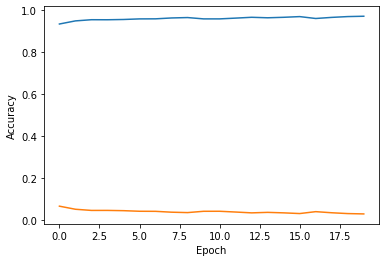

In [71]:
import pandas as pd
plt.plot(history.history['dice_coef'])
plt.plot(history.history['loss']) 
plt.xlabel('Epoch')
plt.ylabel('Accuracy')

# Prediction ad evaluation

In [72]:
pred = model.predict(X_test)  # Shall i give here test data>>?....no  train  results are below

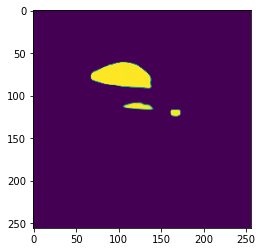

In [85]:
plt.imshow(pred[1][...,4])

In [74]:
model.evaluate(X_test, y_test)

2/2 [==============================] - 1s 480ms/step - loss: 0.0460 - dice_coef: 0.9600


[0.04597952589392662, 0.960018515586853]

# Visualize the results

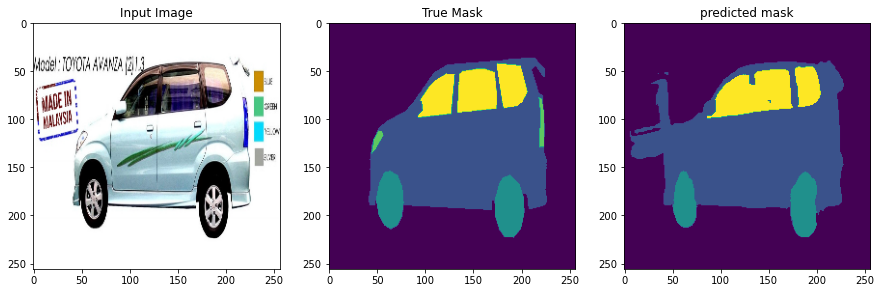

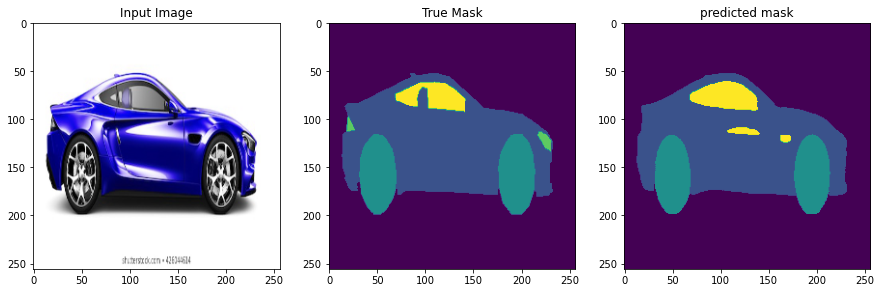

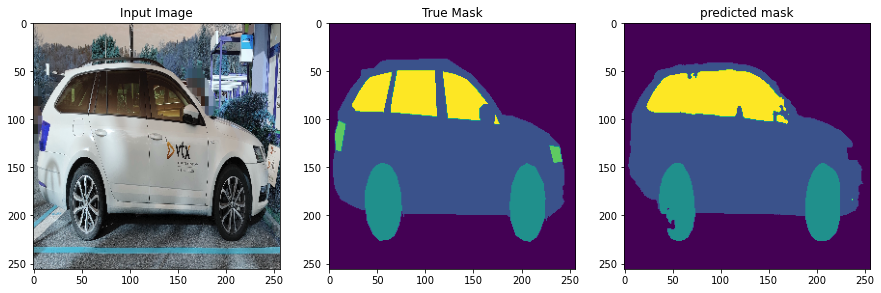

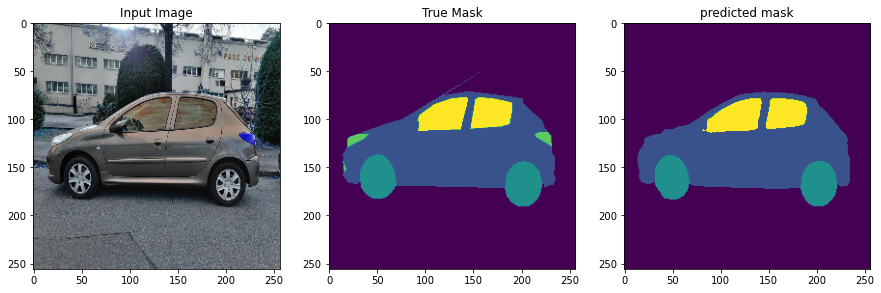

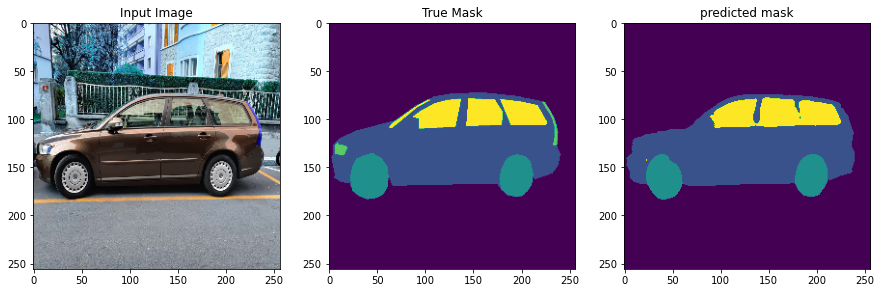

...

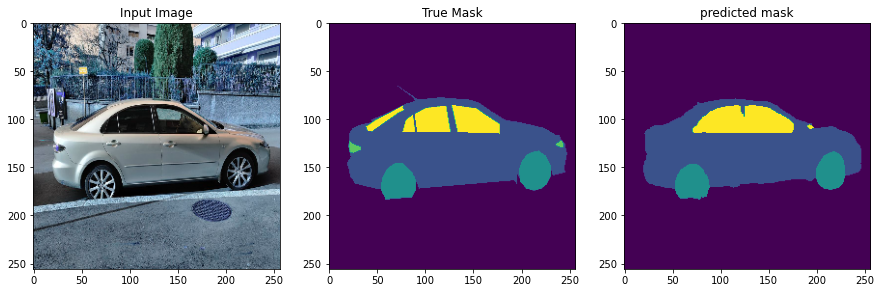

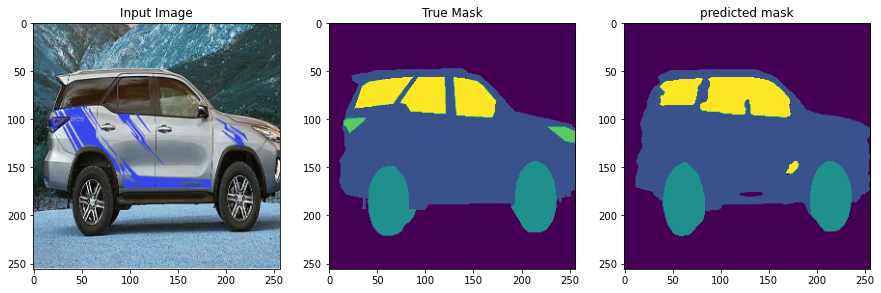

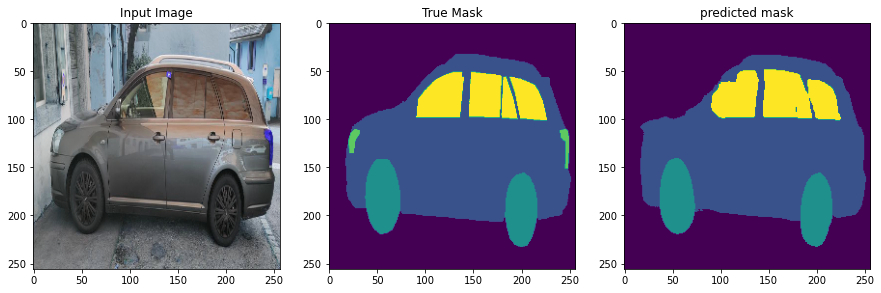

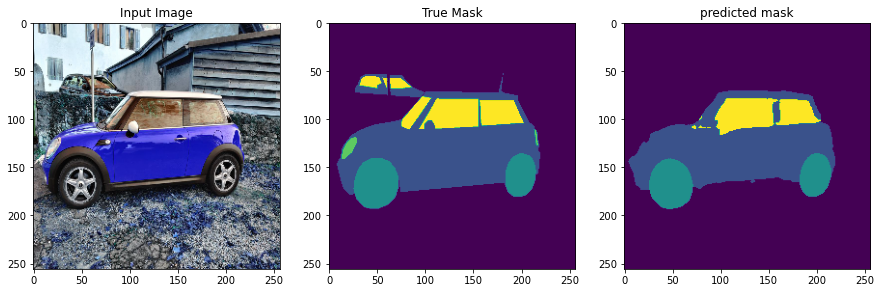

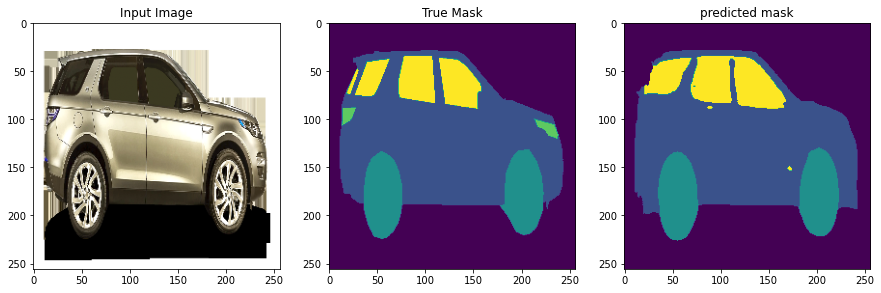

In [75]:
for i in range(26):
    kernel = np.ones((3,3), np.uint8)
    plt.figure(figsize=(15,15))
    plt.subplot(1,3,1)
    plt.imshow(X_test[i])
    plt.title('Input Image')
    plt.subplot(1,3,2)
    plt.imshow(np.argmax(y_test[i],axis=-1))
    plt.title('True Mask')
    plt.subplot(1,3,3)
    plt.imshow(np.argmax(pred[i],axis=-1))
    plt.title('predicted mask')
    plt.show()

In [77]:
# model.save("my_model_Dicecoef.h5")